In [1]:
import numpy as np
import imageio
import cv2
import matplotlib.pyplot as plt
import glob
import skimage
import scipy
from skimage.filters import (threshold_otsu, threshold_niblack,
                             threshold_sauvola)
from skimage import morphology

# BEE DETECT

In [19]:
# Load all images from TRAIN
filenames = glob.glob('../TRAIN/*.jpg')
train_imgs = np.array([np.array(imageio.imread(filename)) for filename in filenames])
train_labels = np.array([np.array(np.genfromtxt(filename[:-3] + 'csv', delimiter=',')) for filename in filenames])

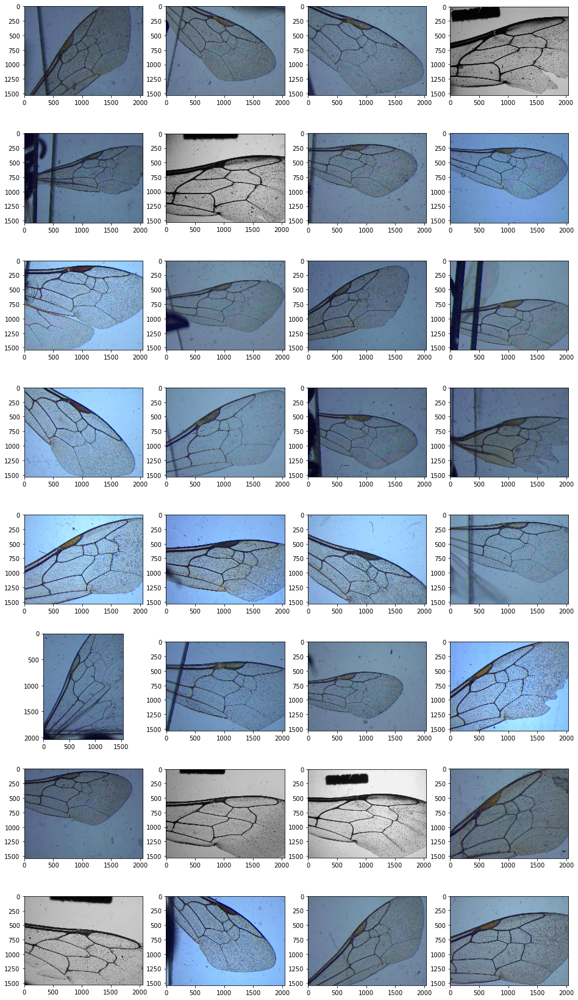

In [3]:
# Print all images from TRAIN
fig=plt.figure(figsize=(16, 30))
for i, img in enumerate(train_imgs):
    fig.add_subplot(8, 4, i+1)
    plt.imshow(img)
plt.show()

In [4]:
# Load one image and CSV from TEST
test_img = imageio.imread('../TEST/01_inf.jpg')
test_points = np.genfromtxt('../TEST/01_inf.csv', delimiter=',')




In [33]:
# Draw points from CSV on the image
def draw_points(img, points):
    img_copy = img.copy()
    for point in points:
        cv2.circle(img_copy,(int(point[1]), int(point[0])), 20, (255,255,0), -1)
    return img_copy

In [34]:
def draw_points_train(img, points):
    img_copy = img.copy()
    for point in points:
        cv2.circle(img_copy,(int(point[0]), int(point[1])), 20, (255,255,0), -1)
    return img_copy

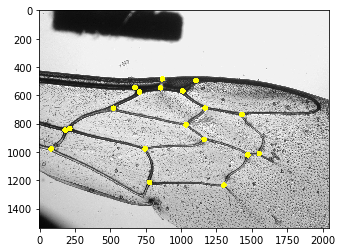

In [35]:
plt.imshow(draw_points(test_img, test_points))

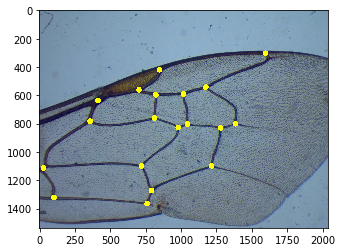

In [36]:
 plt.imshow(draw_points_train(train_imgs[i], train_labels[i]))

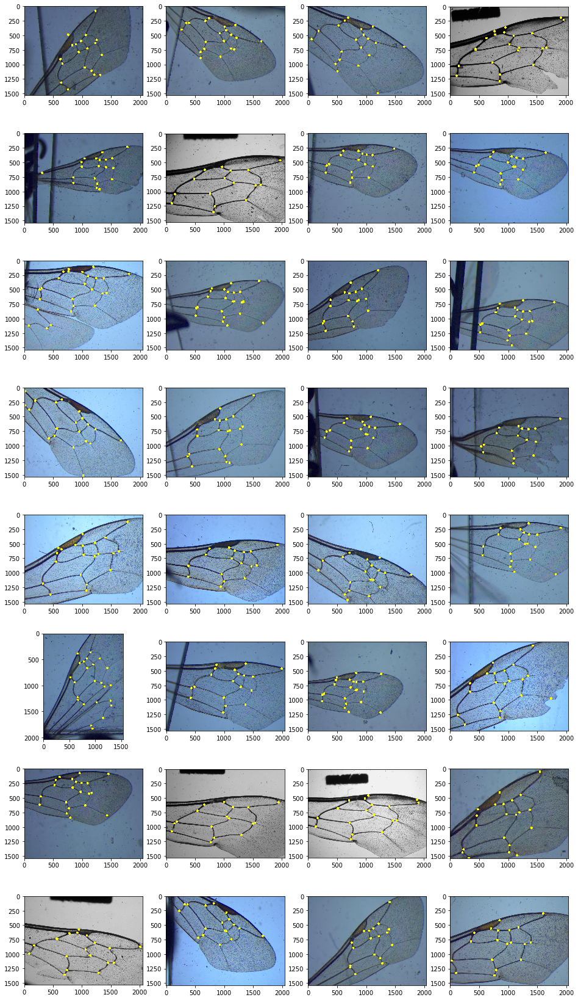

In [37]:
fig=plt.figure(figsize=(16, 30))
for i in range(0, len(train_imgs)):
    fig.add_subplot(8, 4, i+1)
    plt.imshow(draw_points_train(train_imgs[i], train_labels[i]))

## Threshold the image

In [7]:
img = train_imgs[0].copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray,(5,5),0)
#th3 = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,179,28)
ret, thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

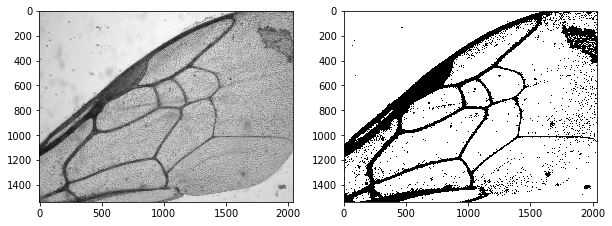

In [8]:
fig=plt.figure(figsize=(10, 10))

fig.add_subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')

fig.add_subplot(1, 2, 2)
plt.imshow(thresh, cmap='gray')

plt.show()

## Noise Removal

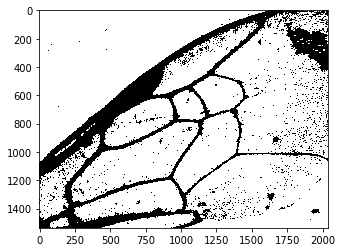

In [9]:
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 3)
plt.imshow(opening, cmap='gray')

## Connected Components

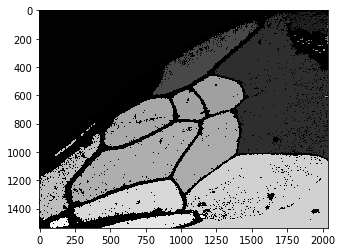

In [10]:
retval, markers = cv2.connectedComponents(opening)
plt.imshow(markers, cmap='gray')

## Watershed

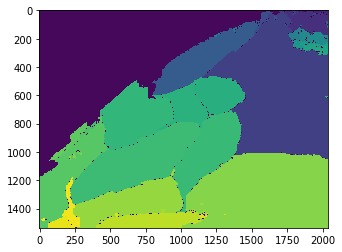

In [11]:
ws = cv2.watershed(img,markers)
plt.imshow(ws)

## Without Connected Components

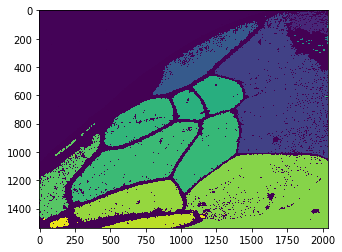

In [12]:
all_labels = skimage.measure.label(opening)
plt.imshow(all_labels)

# Results

In [13]:
def process(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(5,5),0)
    ret, thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 3)
    retval, markers = cv2.connectedComponents(opening)
    ws = cv2.watershed(img,markers)
    return ws

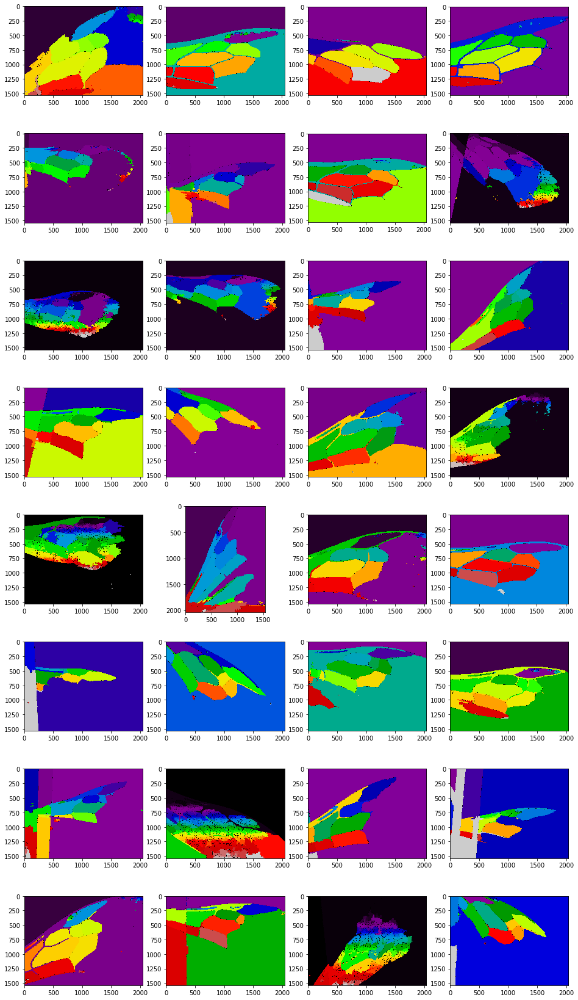

In [41]:
fig=plt.figure(figsize=(16, 30))
for i in range (0, 32):
    img = train_imgs[i].copy()
    ws = process(img)
    fig.add_subplot(8, 4, i+1)
    plt.imshow(ws, cmap='nipy_spectral')
plt.show()

## Without Connected Components

In [98]:
def process2(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(5,5),0)
    ret, thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 3)
    all_labels = skimage.measure.label(opening)
    return all_labels

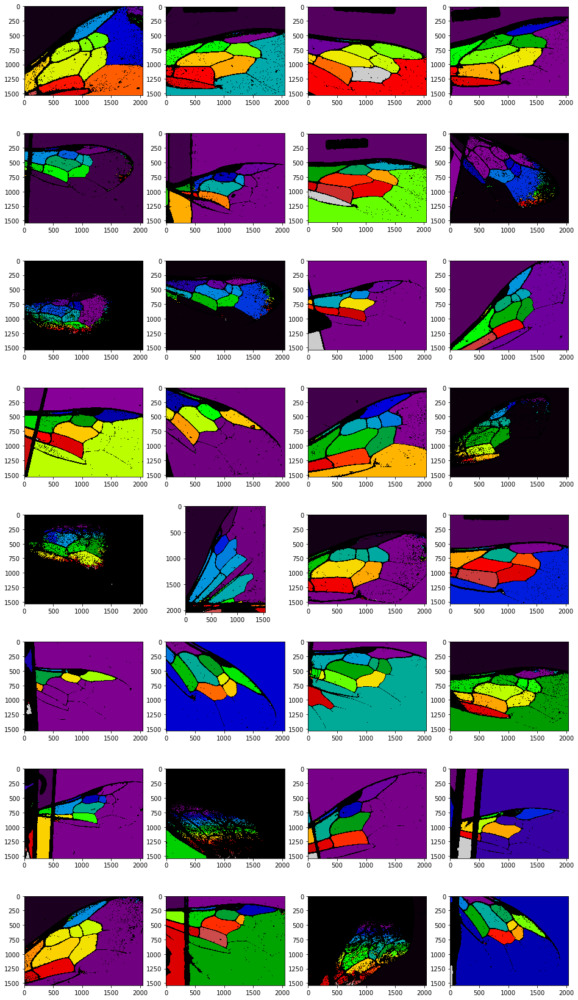

In [99]:
fig=plt.figure(figsize=(16, 30))
for i in range (0, 32):
    img = train_imgs[i].copy()
    ws = process2(img)
    fig.add_subplot(8, 4, i+1)
    plt.imshow(ws, cmap='nipy_spectral')
plt.show()


# Hugo changes

In [6]:
def process3(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = gray
    for i in range(20):
        blur = cv2.GaussianBlur(blur,(5,5),0)
    threshold_val = threshold_sauvola(blur, window_size=159)
    bin_img = (blur > threshold_val).astype(np.uint8)
    all_labels = skimage.measure.label(1 - skimage.morphology.remove_small_objects((1 - bin_img).astype(bool),min_size=5000))
    kernel = np.ones((5,5), np.uint8)
    img_dilate = cv2.dilate(all_labels.astype(np.uint8), kernel, iterations=3) 
    return img_dilate

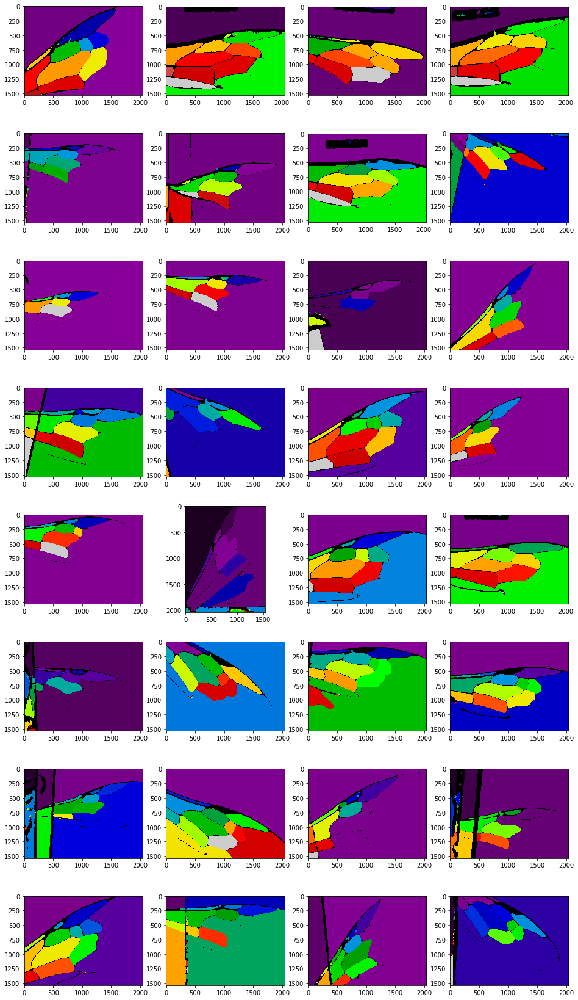

In [8]:
fig=plt.figure(figsize=(16, 30))
for i in range (0, 32):
    img = train_imgs[i].copy()
    ws = process3(img)
    fig.add_subplot(8, 4, i+1)
    plt.imshow(ws, cmap='nipy_spectral')
plt.show()

# Intersections Detection

In [43]:
def intersect(img):
    height, width = img.shape
    step = 60
    intersects = np.full(img.shape, 0)
    for i in range(0, height-step, step):
        for j in range(0, width-step, step):
            colors = set()
            for k in range(i, i+step):
                for l in range(j, j+step):
                    pixel = img[k][l]
                    if pixel != -1 and pixel not in colors:
                        colors.add(pixel)
            if len(colors) >= 4:
                intersects[i+step//2][j+step//2] = 1
                
                
    # mean
    step = 80
    res = [] # list of tuple
    for i in range(0, height-step, step):
        for j in range(0, width-step, step):
            pts = []
            for k in range(i, i+step):
                for l in range(j, j+step):
                    if intersects[k][l] != 0:
                        pts.append((k, l))
            if len(pts) >= 2:
                sum_x = 0
                sum_y = 0
                for point in pts:
                    sum_y += point[0]
                    sum_x += point[1]
                a = (sum_y // len(pts), sum_x // len(pts))
                print(a)
                res.append(a)
            else:
                for point in pts:
                    res.append(point)
    return res

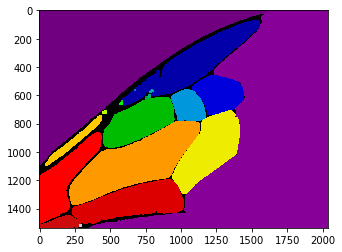

In [44]:
img = train_imgs[0].copy()
ws = process3(img)
plt.imshow(ws, cmap='nipy_spectral')

In [45]:
points = intersect(ws)

(600, 750)
(600, 810)


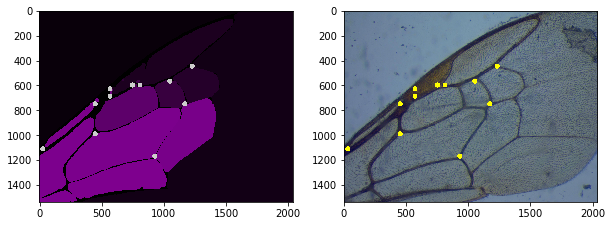

In [46]:
fig=plt.figure(figsize=(10, 10))

fig.add_subplot(1, 2, 1)
plt.imshow(draw_points(ws, points), cmap='nipy_spectral')

fig.add_subplot(1, 2, 2)
plt.imshow(draw_points(img, points))

plt.show()

# Detection on train images

(600, 750)
(600, 810)
(1320, 30)
(210, 840)
(360, 690)
(870, 120)
(930, 120)
(110, 1790)
(690, 360)
(840, 120)
(1950, 840)
(30, 840)
(840, 1050)
(600, 30)
(630, 120)
(600, 630)
(750, 120)
(750, 360)
(830, 110)
(1410, 120)
(1470, 120)
(600, 870)
(630, 1080)
(600, 90)
(840, 600)
(870, 1080)
(1110, 1080)
(600, 150)
(750, 840)
(990, 120)
(1070, 110)
(570, 600)
(1320, 1050)
(370, 350)
(450, 360)
(510, 360)
(1230, 360)
(600, 810)
(690, 840)
(1320, 630)
(150, 360)
(360, 90)
(600, 90)


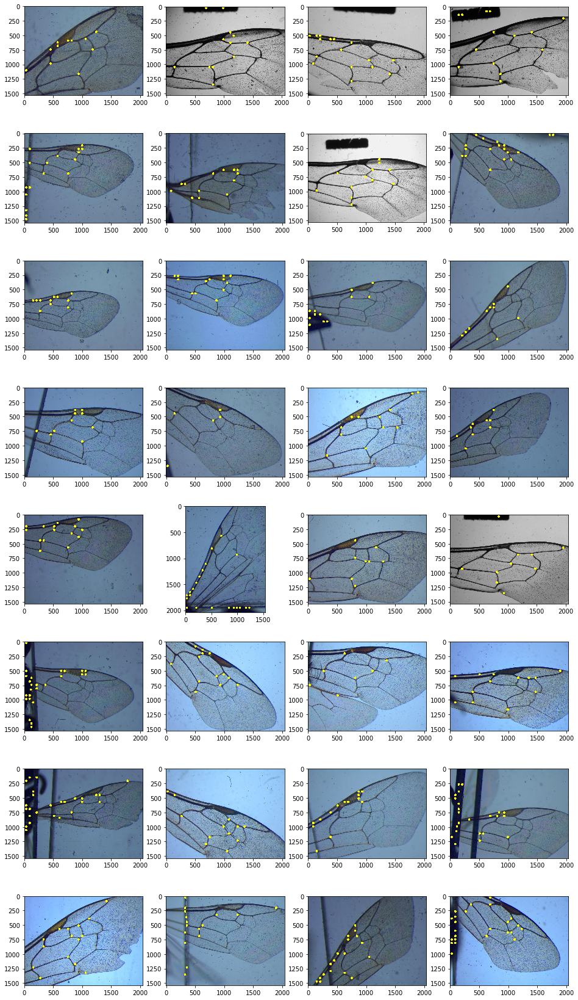

In [47]:
fig=plt.figure(figsize=(16, 30))
for i in range (0, 32):
    img = train_imgs[i].copy()
    ws = process3(img)
    points = intersect(ws)
    fig.add_subplot(8, 4, i+1)
    plt.imshow(draw_points(img, points))
plt.show()


# Detection on test image

In [22]:
test_img = imageio.imread('../TEST/01_inf.jpg')
test_points = np.genfromtxt('../TEST/01_inf.csv', delimiter=',')
ws = process(test_img)
points = intersect(ws)

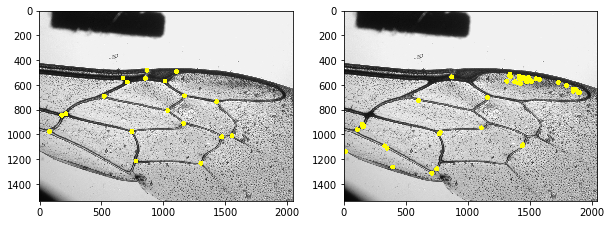

In [23]:
fig=plt.figure(figsize=(10, 10))

fig.add_subplot(1, 2, 1)
plt.imshow(draw_points(test_img, test_points), cmap='nipy_spectral')

fig.add_subplot(1, 2, 2)
plt.imshow(draw_points(test_img, points))

plt.show()

# Compute score

# Colorize edges

In [24]:
def process3(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(5,5),0)
    ret, thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 3)
    
    bg = cv2.dilate(opening,kernel,iterations=3)
    dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    ret, fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    fg = np.uint8(fg)
    unknown = cv2.subtract(bg,fg)
    retval, markers = cv2.connectedComponents(fg)
    markers = markers+1
    markers[unknown==255] = 0
    markers = cv2.watershed(img,markers)
    img[markers == -1] = [255,0,0]
    return ws

In [25]:
img = train_imgs[0].copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray,(5,5),0)
ret, thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 3)

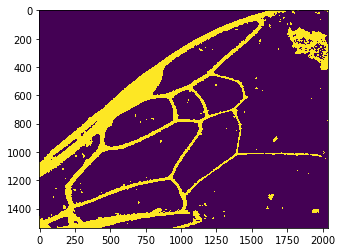

In [26]:
plt.imshow(opening)

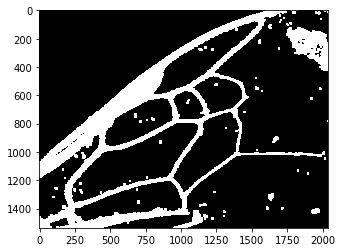

In [27]:
bg = cv2.dilate(opening,kernel,iterations=4)
plt.imshow(bg, cmap='gray')

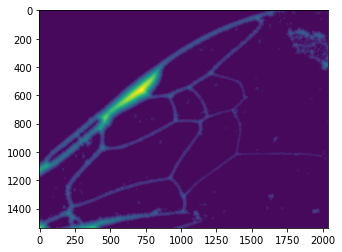

In [28]:
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
toto = cv2.dilate(dist_transform,kernel,iterations=5)
ws = cv2.watershed(img,np.int32(toto))
retval, markers = cv2.connectedComponents(opening)
all_labels = skimage.measure.label(opening)
plt.imshow(ws)

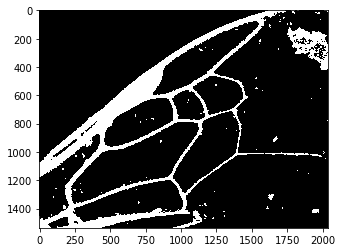

In [29]:
ret, fg = cv2.threshold(dist_transform,0.0*dist_transform.max(),255,0)
fg = np.uint8(fg)
plt.imshow(fg, cmap='gray')

In [37]:
from skimage import data, img_as_float
from skimage.feature import corner_harris


def plot_harris_points(image, filtered_coords):
    """ plots corners found in image"""

    plt.plot()
    plt.imshow(image)
    plt.plot([p[1] for p in filtered_coords],
             [p[0] for p in filtered_coords],
             'b.')
    plt.axis('off')
    plt.show()


im = img_as_float(data.lena())
filtered_coords = harris(im, min_distance=6)
plot_harris_points(im, filtered_coords)


AttributeError: module 'skimage.data' has no attribute 'lena'

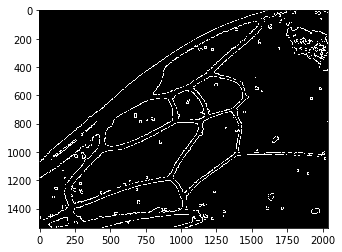

In [30]:
unknown = cv2.subtract(bg,fg)
plt.imshow(unknown, cmap='gray')

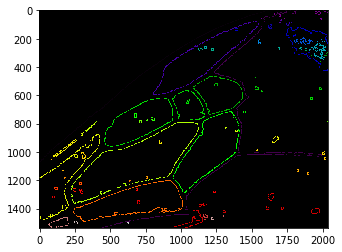

In [31]:
retval, markers = cv2.connectedComponents(unknown)
all_labels = skimage.measure.label(unknown)
plt.imshow(all_labels, cmap='nipy_spectral')

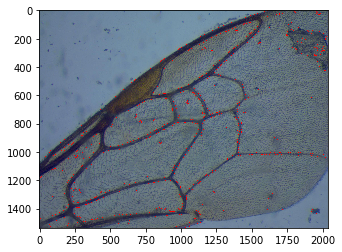

In [32]:
retval, markers = cv2.connectedComponents(fg)
markers = markers+1
markers[unknown==255] = 0
markers = cv2.watershed(img,markers)
img[markers == -1] = [255,0,0]
plt.imshow(img)

In [33]:
markers.dtype

dtype('int32')